# Кратко как работают нейросети

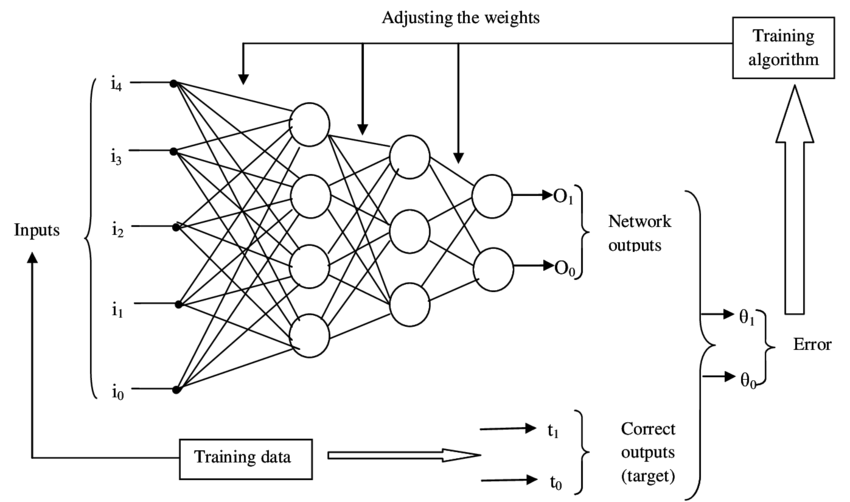

`inputs` - любой типа данных в векторном представлении 

Весь пайплайн выглядит так: https://machinelearningknowledge.ai/wp-content/uploads/2019/10/Backpropagation.gif

Еще подробнее:
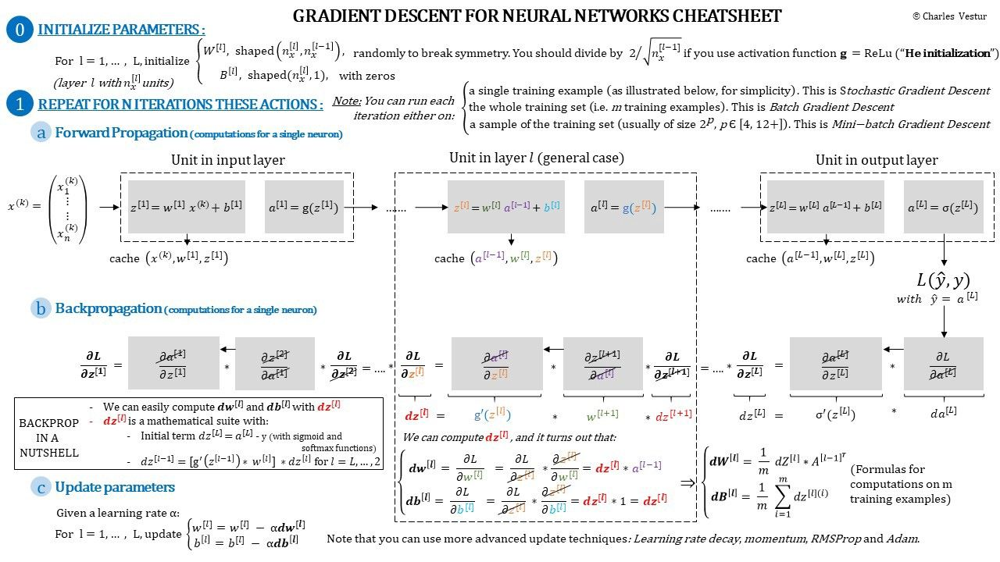

In [27]:
import torch

model = torch.nn.Linear(2, 1, bias=False)
input = torch.rand(2)

output = model(input)

output.backward()

print(model.weight, input, output, model.weight.grad)

Parameter containing:
tensor([[-0.4162, -0.3305]], requires_grad=True) tensor([0.7891, 0.0233]) tensor([-0.3362], grad_fn=<SqueezeBackward4>) tensor([[0.7891, 0.0233]])


# Нейросети в компьютерном зрении

По факту почти все архитектуры нейросетей в компьютерном зрении можно свести к:
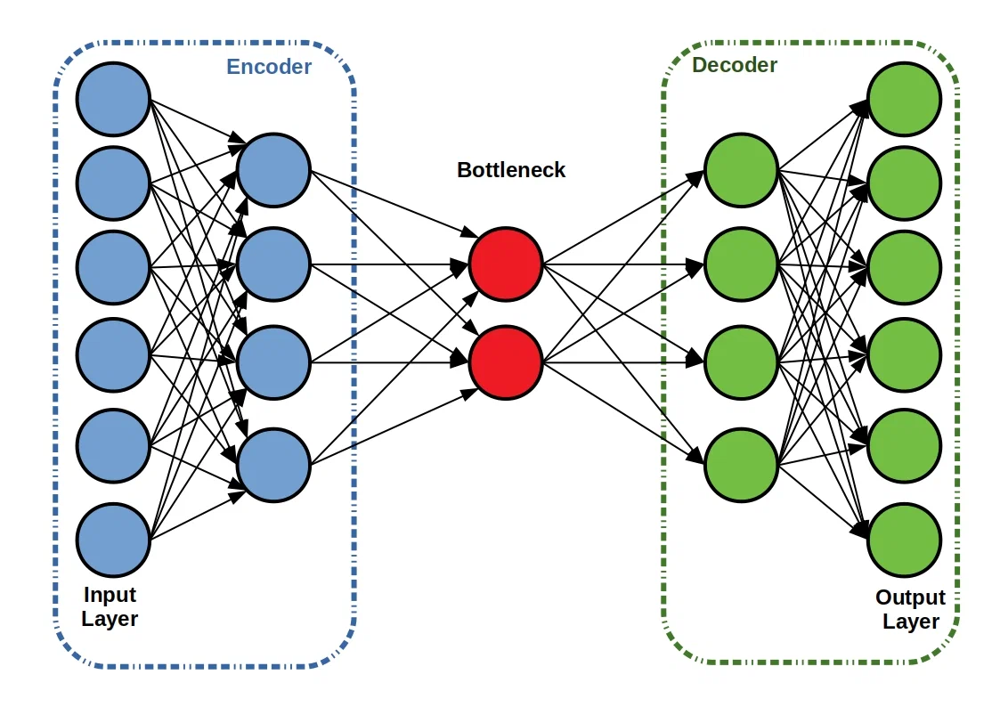

## Глобальные архитектруры

### Полносвязные нейросети

Вы такого не увидите ни на практике, ни здесь :)

### Сверточные нейросети

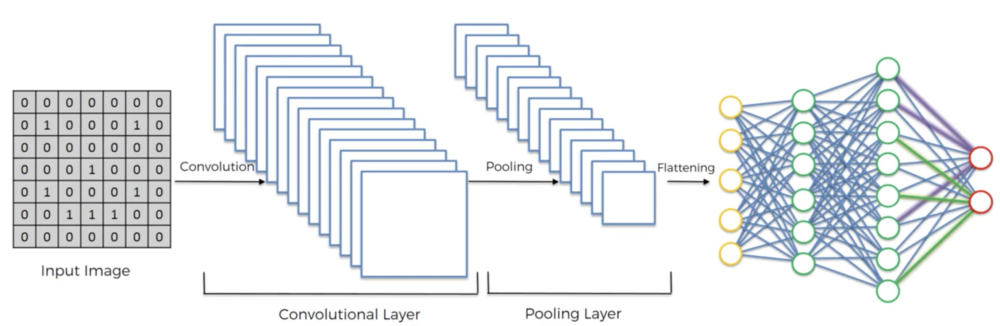


### Трансформеры

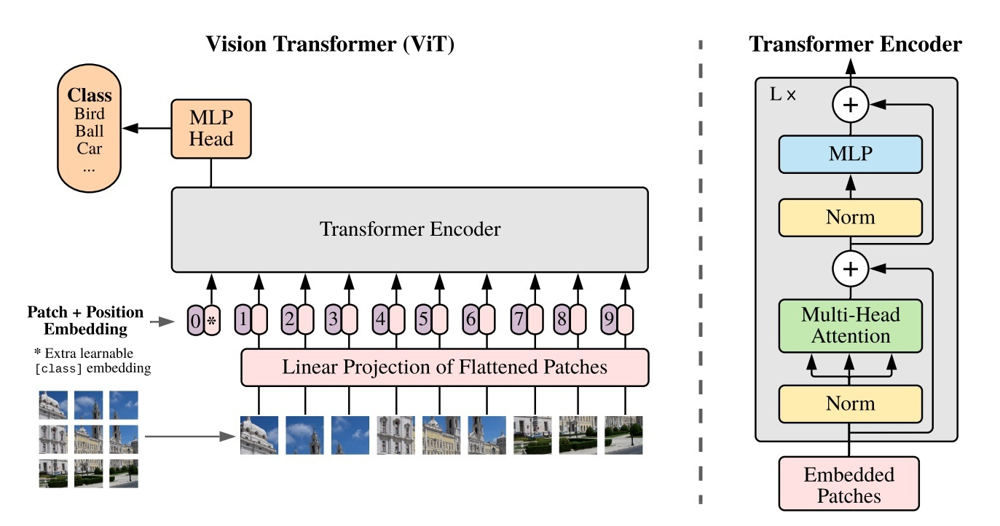

### Гибриды (точно нельзя сказать, что это трансформер или сверточная нейросеть)

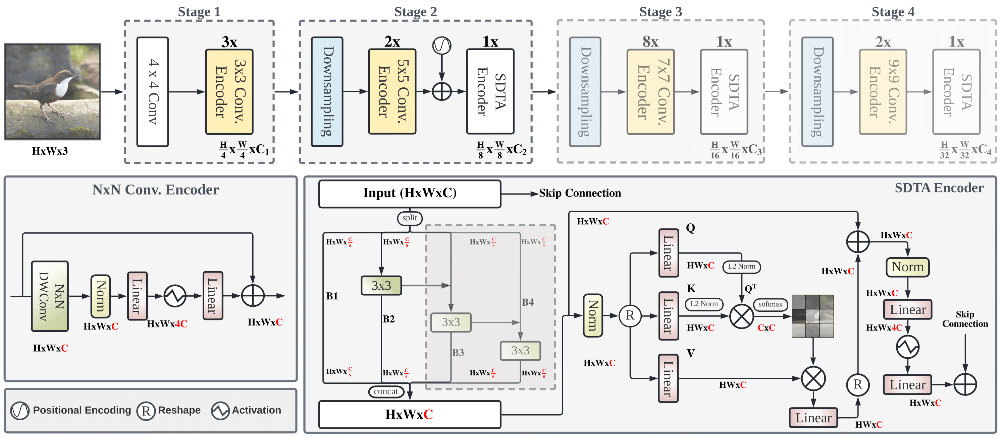

### Реккуренты

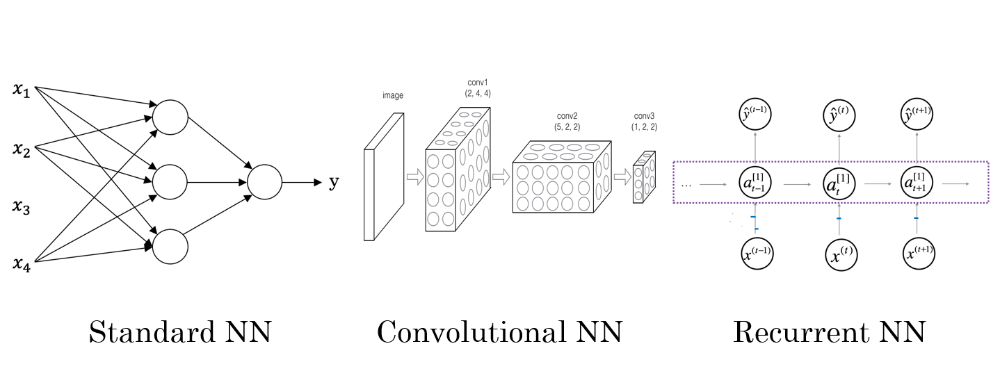

## Популярные слои

### Полносвязные слои

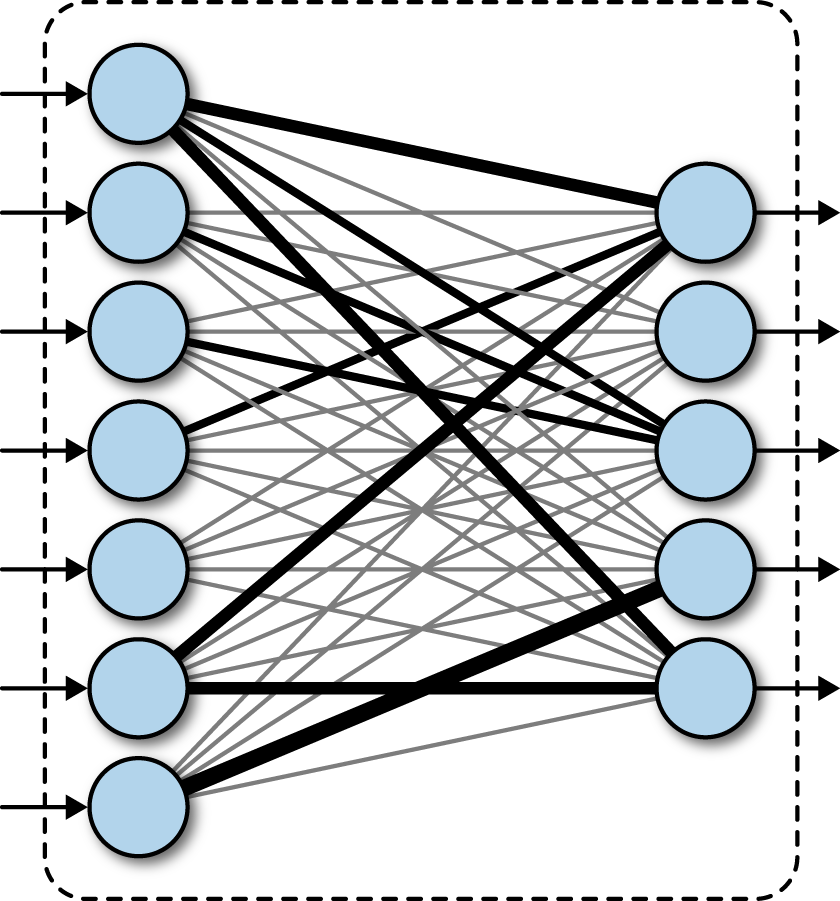

In [46]:
import torch

linear = torch.nn.Linear(in_features=2, out_features=1, bias=False)
input = torch.ones(1, 2)
output = linear(input)

print(f'linear: {linear.weight}')
print(f'input: {input}')
print(f'output: {output}')

linear: Parameter containing:
tensor([[ 0.5633, -0.2621]], requires_grad=True)
input: tensor([[1., 1.]])
output: tensor([[0.3012]], grad_fn=<MmBackward0>)


### Сверточный слой

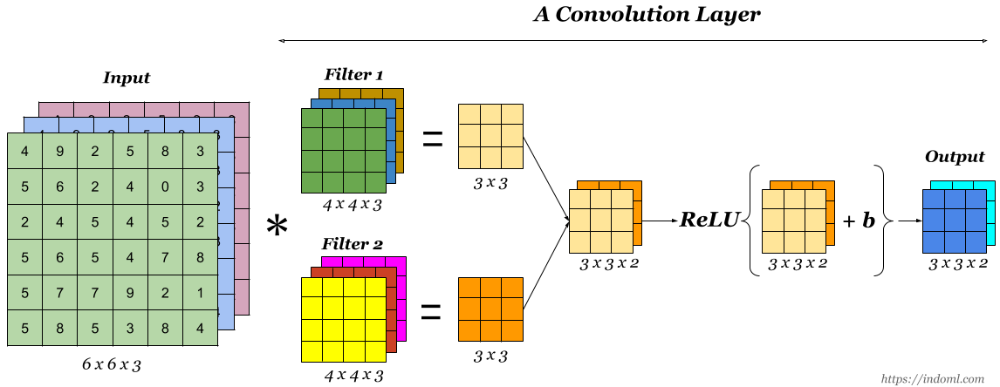

https://upload.wikimedia.org/wikipedia/commons/1/19/2D_Convolution_Animation.gif


In [34]:
import torch

conv = torch.nn.Conv2d(in_channels=1, out_channels=2, kernel_size=2, stride=1, padding=0, bias=False)
input = torch.ones(1, 2, 2)
output = conv(input)

print(f'conv: {conv.weight}')
print(f'input: {input}')
print(f'output: {output}')

conv: Parameter containing:
tensor([[[[ 0.2881,  0.2355],
          [-0.0910, -0.2200]]],


        [[[ 0.3342,  0.0549],
          [ 0.1818, -0.2689]]],


        [[[-0.1708, -0.0752],
          [-0.1686,  0.0593]]],


        [[[ 0.0641, -0.4830],
          [-0.2954,  0.4504]]]], requires_grad=True)
input: tensor([[[1., 1.],
         [1., 1.]]])
output: tensor([[[ 0.2125]],

        [[ 0.3019]],

        [[-0.3553]],

        [[-0.2639]]], grad_fn=<SqueezeBackward1>)


### Pooling слой

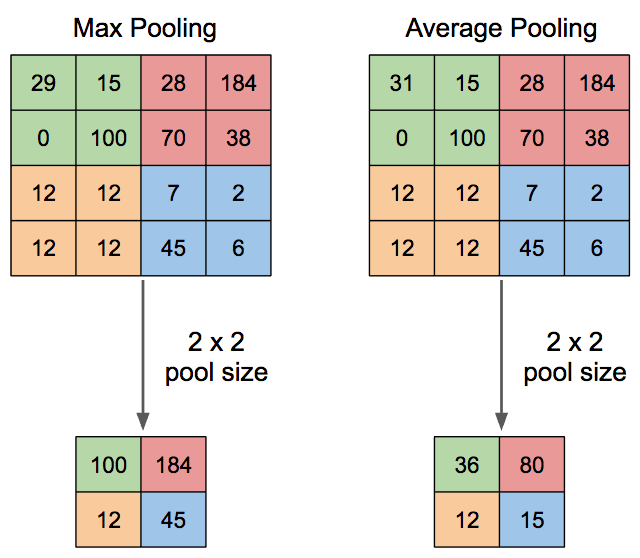

In [38]:
import torch

pool = torch.nn.MaxPool2d(kernel_size=2, stride=1, padding=1)
input = torch.rand(1, 2, 2)
output = pool(input)

print(f'input: {input}')
print(f'output: {output}')

input: tensor([[[0.8137, 0.5009],
         [0.4163, 0.6751]]])
output: tensor([[[0.8137, 0.8137, 0.5009],
         [0.8137, 0.8137, 0.6751],
         [0.4163, 0.6751, 0.6751]]])


### Слои усложнения

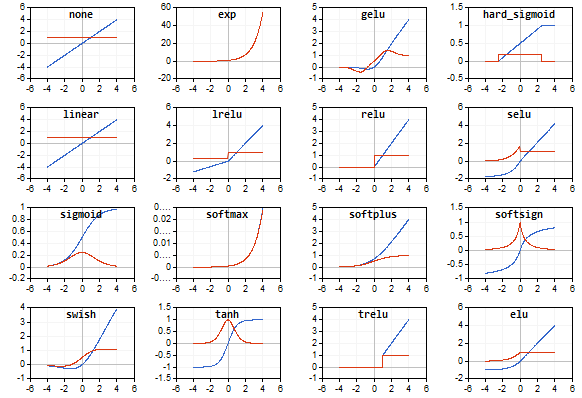

In [44]:
import torch

relu = torch.nn.ReLU()
input = torch.rand(1, 2, 2) - 0.5
output = relu(input)

print(f'input: {input}')
print(f'output: {output}')

input: tensor([[[ 0.0885,  0.2610],
         [ 0.0933, -0.0553]]])
output: tensor([[[0.0885, 0.2610],
         [0.0933, 0.0000]]])


## Попытка сделать свой классификатор №1

In [59]:
import torch

class Classificator1(torch.nn.Module):
    def __init__(self, num_classes = 1):
        super().__init__()
        
        self._conv1 = torch.nn.Conv2d(in_channels=3, out_channels=32, kernel_size=5)
        self._relu1 = torch.nn.ReLU()

        self._pool1 = torch.nn.MaxPool2d(kernel_size=2)

        self._conv2 = torch.nn.Conv2d(in_channels=32, out_channels=16, kernel_size=5)
        self._relu2 = torch.nn.ReLU()

        self._fc = torch.nn.Linear(256, num_classes, bias=True)


    def forward(self, inputs):
        x = inputs
        print(x.mean(), x.std())
        x = self._conv1(x)
        x = self._relu1(x)
        x = self._pool1(x)
        print(x.mean(), x.std())
        x = self._conv2(x)
        x = self._relu2(x)
        print(x.mean(), x.std())
        x = torch.flatten(x, start_dim=1, end_dim=3)
        x = self._fc(x)
        return x


model = Classificator1(num_classes=2)

input = torch.rand(1, 3, 20, 20).clip(0, 1e-3)
with torch.no_grad():
    output = model(input)
output.shape

tensor(0.0010) tensor(2.3550e-05)
tensor(0.0417) tensor(0.0392)
tensor(0.0202) tensor(0.0179)


torch.Size([1, 2])

### Слои нормализации

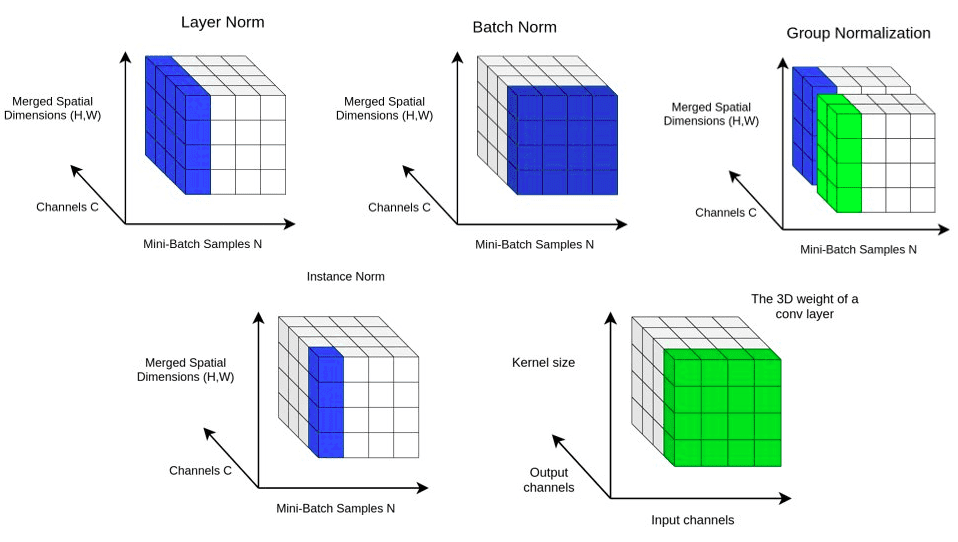

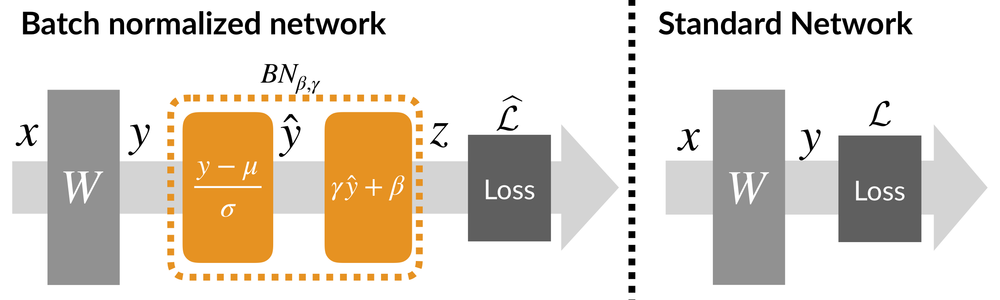

In [66]:
import torch
batch_size = 32
norm = torch.nn.BatchNorm2d(num_features=1)
input = torch.rand(batch_size, 1, 2, 2)
output = norm(input)

print(f'norm: {norm.weight}')
print(f'input: {input.mean()}, {input.std()}')
print(f'output: {output.mean()}, {output.std()}')

norm: Parameter containing:
tensor([1.], requires_grad=True)
input: 0.4918532371520996, 0.2797357141971588
output: 4.377216100692749e-08, 1.0038646459579468


## Попытка сделать свой классификатор №2

In [68]:
import torch

class Classificator1(torch.nn.Module):
    def __init__(self, num_classes = 1):
        super().__init__()
        
        self._conv1 = torch.nn.Conv2d(in_channels=3, out_channels=32, kernel_size=5)
        self._relu1 = torch.nn.ReLU()
        self._norm1 = torch.nn.BatchNorm2d(num_features=32)

        self._pool1 = torch.nn.MaxPool2d(kernel_size=2)

        self._conv2 = torch.nn.Conv2d(in_channels=32, out_channels=16, kernel_size=5)
        self._relu2 = torch.nn.ReLU()
        self._norm2 = torch.nn.BatchNorm2d(num_features=16)

        self._fc = torch.nn.Linear(256, num_classes, bias=True)


    def forward(self, inputs):
        x = inputs
        print(x.mean(), x.std())
        x = self._conv1(x)
        x = self._relu1(x)
        x = self._norm1(x)
        x = self._pool1(x)
        print(x.mean(), x.std())
        x = self._conv2(x)
        x = self._relu2(x)
        x = self._norm2(x)
        print(x.mean(), x.std())
        x = torch.flatten(x, start_dim=1, end_dim=3)
        x = self._fc(x)
        return x


model = Classificator1(num_classes=2)

input = torch.rand(32, 3, 20, 20).clip(0, 1e-3)
with torch.no_grad():
    output = model(input)
output.shape

tensor(0.0010) tensor(1.6534e-05)
tensor(0.0003) tensor(0.0025)
tensor(-2.4505e-08) tensor(0.2343)


torch.Size([32, 2])

А что будет, если мы будем обучаться в основном на таким примерах?
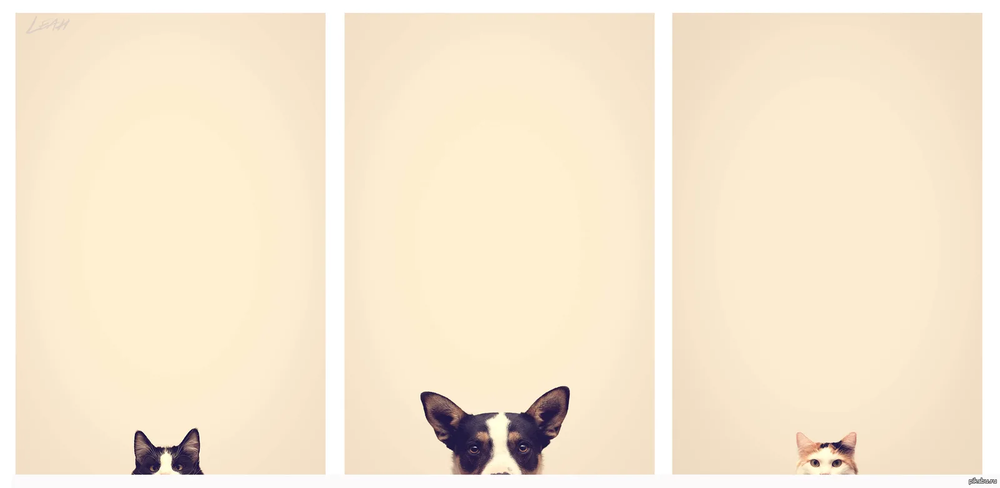

### Ансамблирование как слой (DropOut)

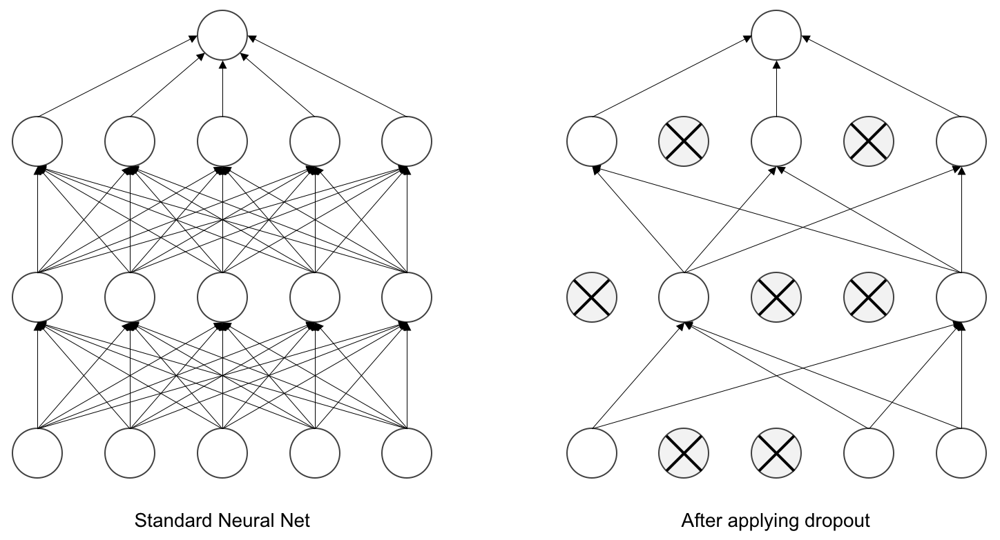

In [82]:
import torch

drop = torch.nn.Dropout(p=0.5)
input = torch.rand(1, 2, 2)
output = drop(input)

print(f'input: {input}')
print(f'output: {output}')

input: tensor([[[0.1921, 0.4506],
         [0.2003, 0.6313]]])
output: tensor([[[0.3843, 0.0000],
         [0.4006, 1.2627]]])


In [83]:
drop.eval()
output = drop(input)

print(f'input: {input}')
print(f'output: {output}')

input: tensor([[[0.1921, 0.4506],
         [0.2003, 0.6313]]])
output: tensor([[[0.1921, 0.4506],
         [0.2003, 0.6313]]])


## Попытка сделать свой классификатор №3

In [173]:
import torch

class Classificator1(torch.nn.Module):
    def __init__(self, num_classes = 1):
        super().__init__()
        
        self._conv1 = torch.nn.Conv2d(in_channels=3, out_channels=32, kernel_size=5)
        self._relu1 = torch.nn.ReLU()
        self._norm1 = torch.nn.BatchNorm2d(num_features=32)

        self._pool1 = torch.nn.MaxPool2d(kernel_size=2)

        self._conv2 = torch.nn.Conv2d(in_channels=32, out_channels=16, kernel_size=5)
        self._relu2 = torch.nn.ReLU()
        self._norm2 = torch.nn.BatchNorm2d(num_features=16)

        self._drop = torch.nn.Dropout(p=0.5)
        self._fc = torch.nn.Linear(256, num_classes, bias=True)


    def forward(self, inputs):
        x = inputs
        x = self._conv1(x)
        x = self._relu1(x)
        x = self._norm1(x)
        x = self._pool1(x)
        x = self._conv2(x)
        x = self._relu2(x)
        x = self._norm2(x)
        x = torch.flatten(x, start_dim=1, end_dim=3)
        x = self._drop(x)
        x = self._fc(x)
        return x


model = Classificator1(num_classes=2)

input = torch.rand(32, 3, 20, 20).clip(0, 1e-3)
with torch.no_grad():
    output = model(input)
output.shape

torch.Size([32, 2])

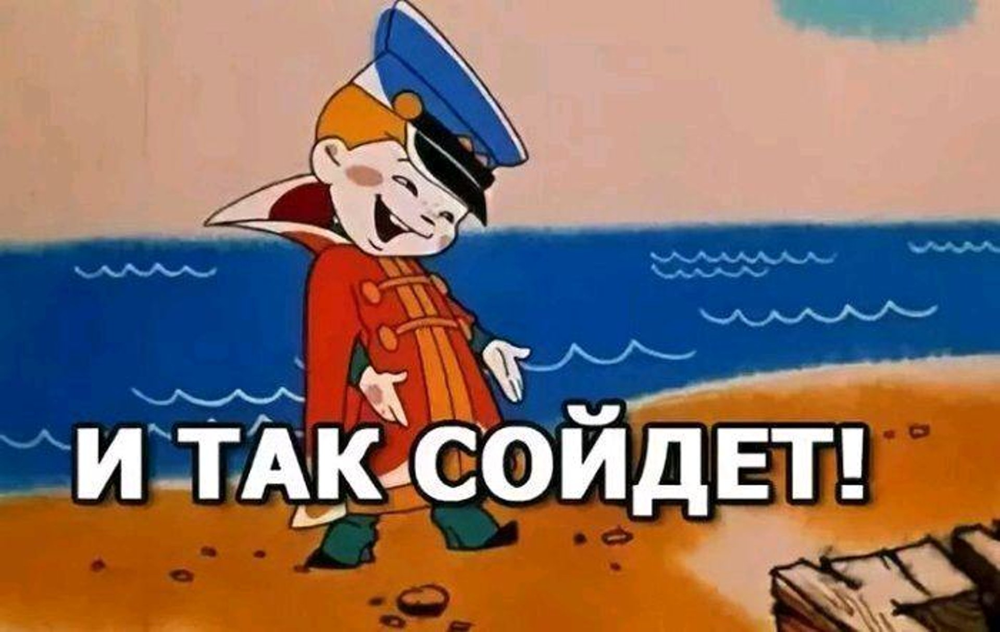

## Попытка сделать нормальный классификатор

In [197]:
import torch

class ConvBlock(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self._conv = torch.nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, padding=2, stride=1)
        self._relu = torch.nn.ReLU()
        self._norm = torch.nn.BatchNorm2d(num_features=out_channels)
        self._pool = torch.nn.MaxPool2d(kernel_size=2)

    def forward(self, inputs):
        x = inputs
        x = self._conv(x)
        x = self._relu(x)
        x = self._norm(x)
        x = self._pool(x)
        return x

class NormalClassificator(torch.nn.Module):
    channels = [3, 32, 64, 32, 16]
    def __init__(self, num_classes):
        super().__init__()
        self._blocks = torch.nn.ModuleList([
            ConvBlock(in_channels=self.channels[idx], out_channels=self.channels[idx + 1]) for idx in range(len(self.channels) - 1)
        ])

        self._global_pool = torch.nn.AdaptiveAvgPool2d(output_size=(5, 5))
        self._drop = torch.nn.Dropout(p=0.5)
        self._fc = torch.nn.Linear(400, num_classes, bias=True)

    def forward(self, inputs):
        x = inputs
        for block in self._blocks:
            x = block(x)
        x = self._global_pool(x)
        x = torch.flatten(x, start_dim=1, end_dim=3)
        x = self._drop(x)
        x = self._fc(x)
        return x

model = NormalClassificator(num_classes=2)

input = torch.rand(32, 3, 64, 64).clip(0, 1e-3)
output = model(input)
output.shape

torch.Size([32, 2])

## Проблемы нейросетей и способы их решений на примерах

### Затухающийся (взрывающийся) градиент

В первых нейросетях градиент не доходил до первых ее слоев, что вызывало затухиние градиента.

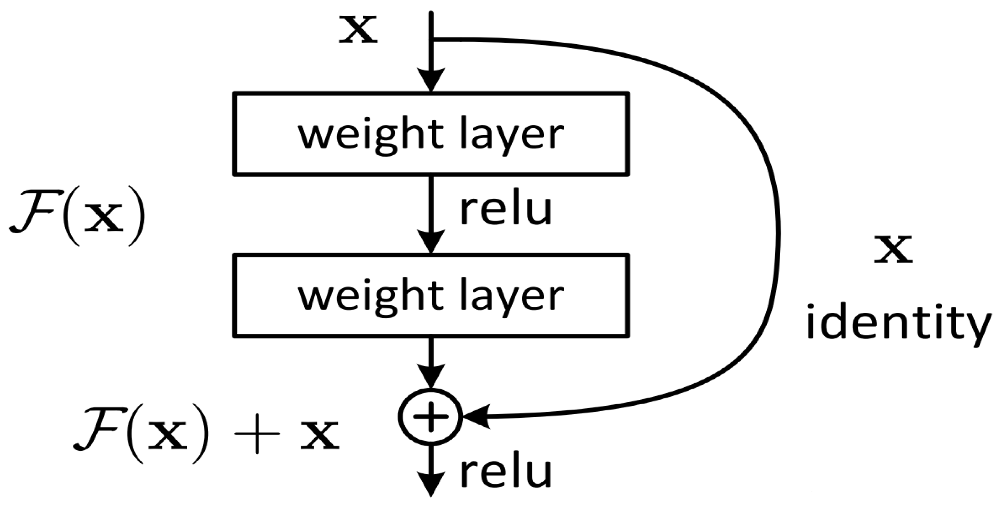

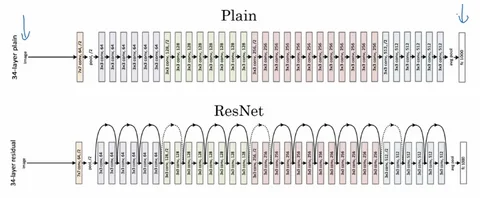

## Недостаточное рецептивное поле

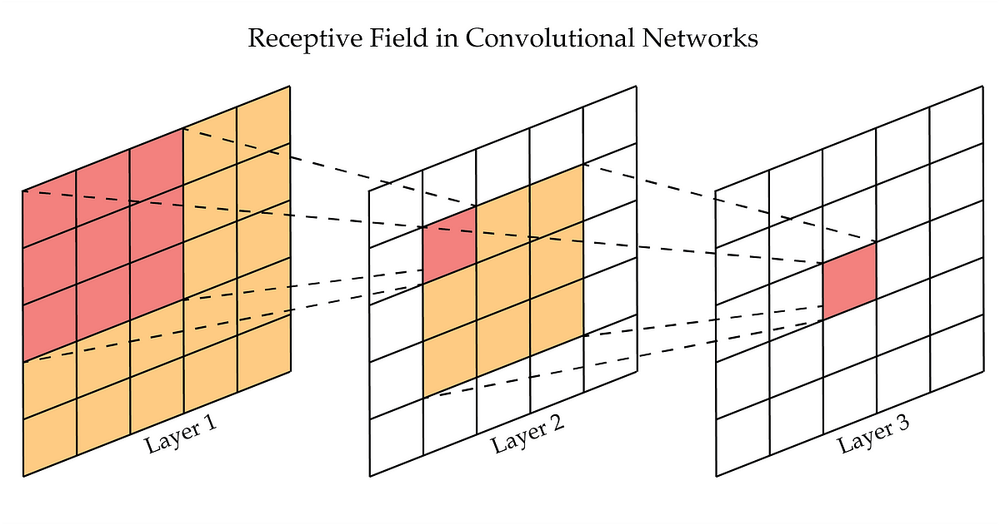

Одно из решений - использовать dilation свертки

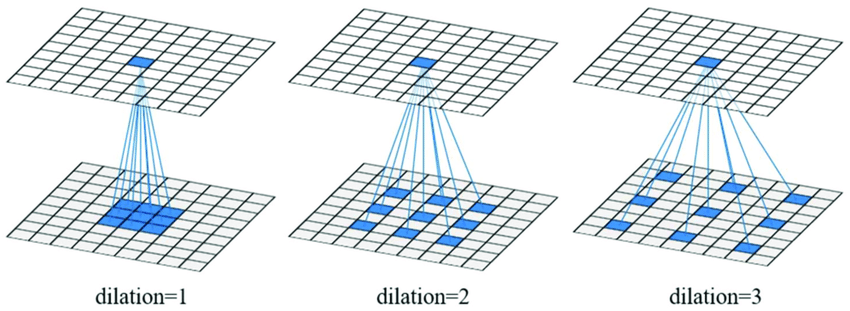

In [97]:
import torch

conv = torch.nn.Conv2d(in_channels=1, out_channels=4, kernel_size=2, stride=1, padding=0, bias=False, dilation=1)
input = torch.ones(1, 4, 4)
output = conv(input)

output.shape

torch.Size([4, 3, 3])

In [176]:
conv = torch.nn.Conv2d(in_channels=1, out_channels=4, kernel_size=2, stride=1, padding=1, bias=False, dilation=2)
input = torch.ones(1, 4, 4)
output = conv(input)

output.shape

torch.Size([4, 4, 4])

## Плохо учитывается информация между каналами

Для решения можно, например, перевзвешивать каналы между собой,  как это делается в SeNet

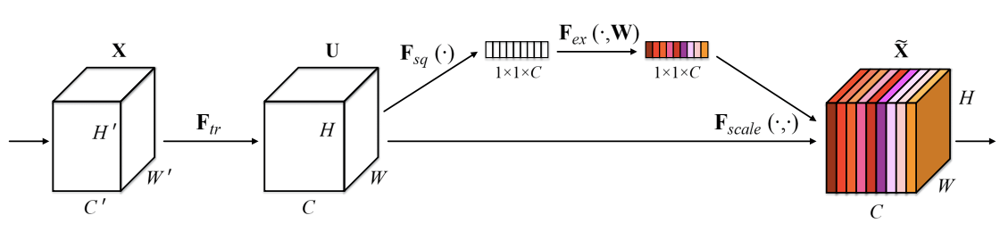

## Плохо учитывается пространственная информация (другие области изображения)

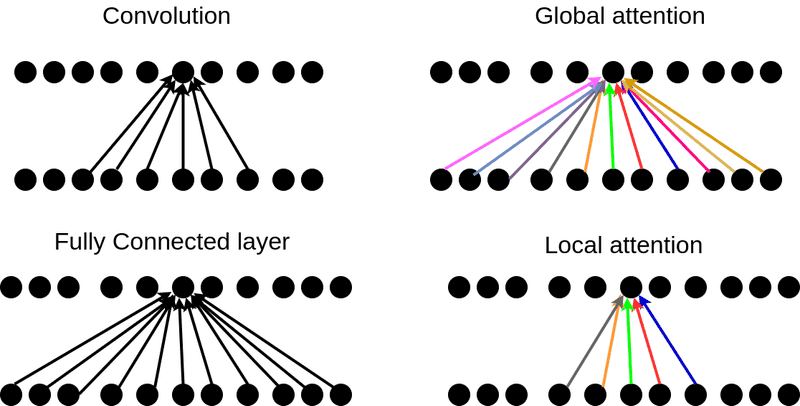

Для того, чтобы убить сразу двух зайцев можно использовать CBAM модуль:
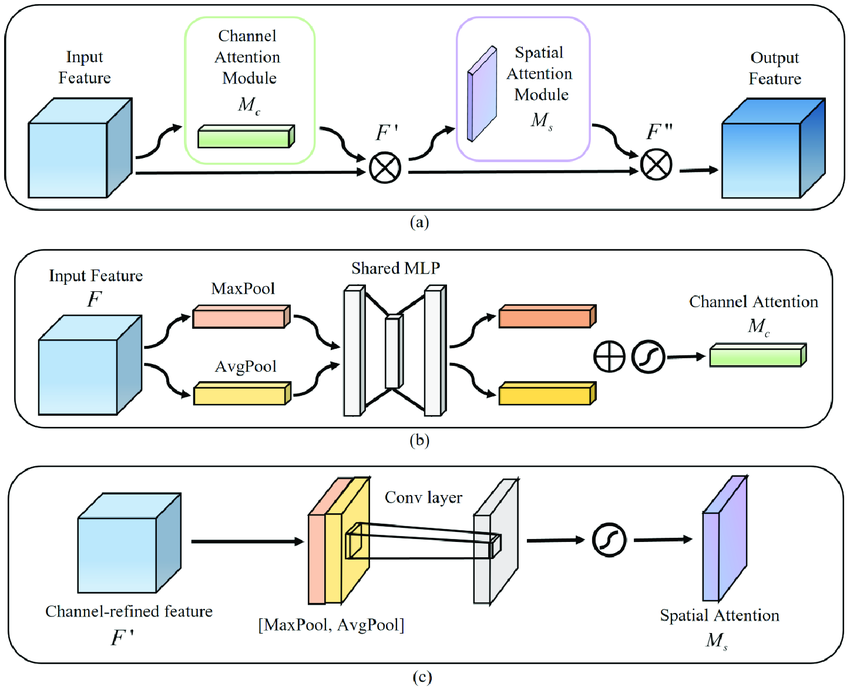

О проблемах нейросетей и способово их решения можно говорить очень долго, но надо идти дальше :)

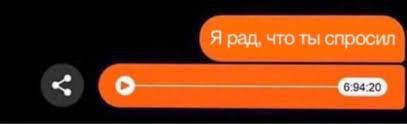

# Классификация изображений

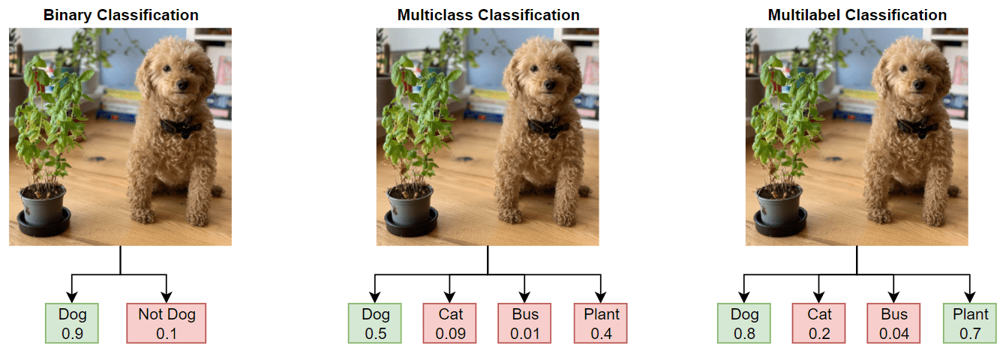

In [110]:
import torch


# Блок классификации для binary/multiclass

class MulticlassFC(torch.nn.Module):
    def __init__(self, in_features, out_features):
        super().__init__()

        self._fc = torch.nn.Linear(in_features, out_features)

    def forward(self, inputs):
        x = inputs
        x = self._fc(x)
        if self.training:
            x = torch.nn.functional.softmax(x, dim=-1)
        else:
            x = torch.argmax(x, dim=-1)
        return x

# Блок классификации для multilabel

class MultilabelFC(torch.nn.Module):
    def __init__(self, in_features, out_features):
        super().__init__()

        self._fc = torch.nn.Linear(in_features, out_features)

    def forward(self, inputs):
        x = inputs
        x = self._fc(x)
        x = torch.nn.functional.sigmoid(x)
        return x


milticlass_fc = MulticlassFC(10, 2)
miltilabel_fc = MultilabelFC(10, 2)

inputs = torch.rand(4, 10)

print(milticlass_fc(inputs), miltilabel_fc(inputs))

tensor([[0.5525, 0.4475],
        [0.5094, 0.4906],
        [0.4870, 0.5130],
        [0.4424, 0.5576]], grad_fn=<SoftmaxBackward0>) tensor([[0.5091, 0.5524],
        [0.4186, 0.5849],
        [0.4457, 0.5329],
        [0.4337, 0.5474]], grad_fn=<SigmoidBackward0>)


In [111]:
milticlass_fc.eval()
miltilabel_fc.eval()

print(milticlass_fc(inputs), miltilabel_fc(inputs))

tensor([0, 0, 1, 1]) tensor([[0.5091, 0.5524],
        [0.4186, 0.5849],
        [0.4457, 0.5329],
        [0.4337, 0.5474]], grad_fn=<SigmoidBackward0>)


## Loss функции для классификации

### Crossentropy loss

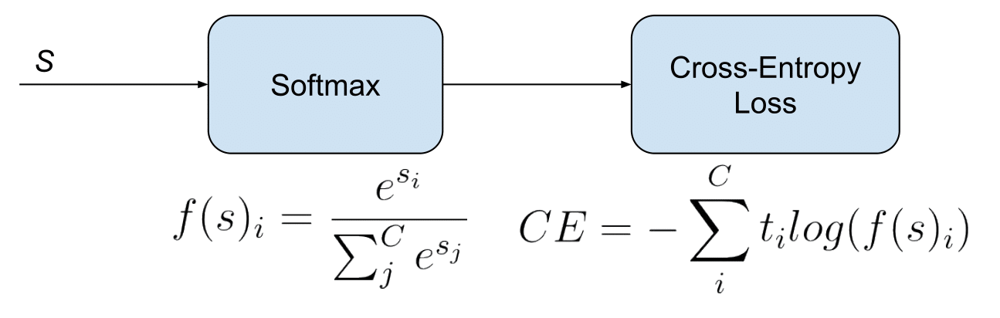

In [116]:
import torch

loss = torch.nn.CrossEntropyLoss()
inputs = torch.rand(4, 10)
targets = torch.arange(4)
loss(inputs, torch.arange(4))

tensor(2.3077)

## Focal Loss

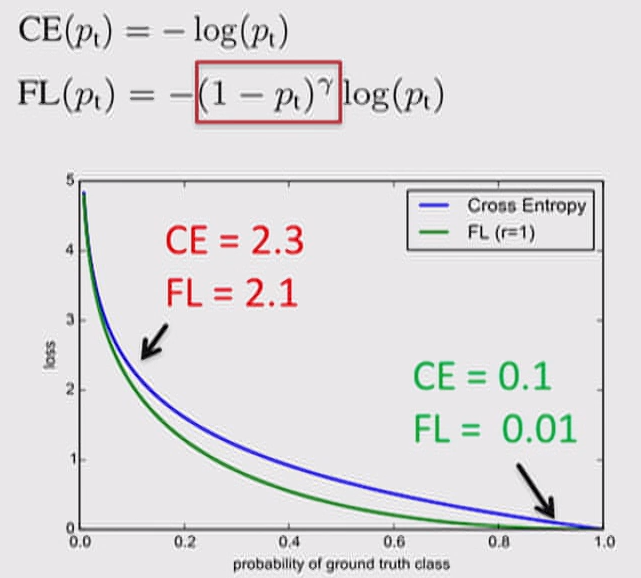

## Метрики

## Метрики матрицы ошибок

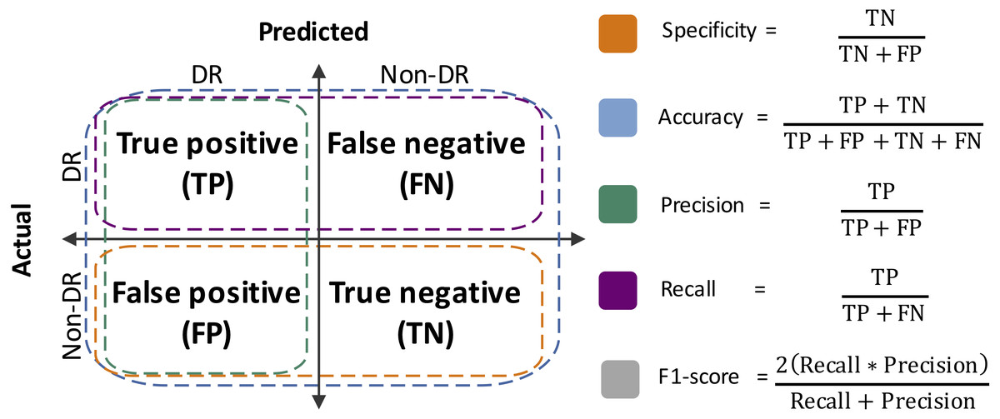

## ROC AUC

Это проще всего запомнить как "доля правильно отранжированных пар вероятностей классификатора":
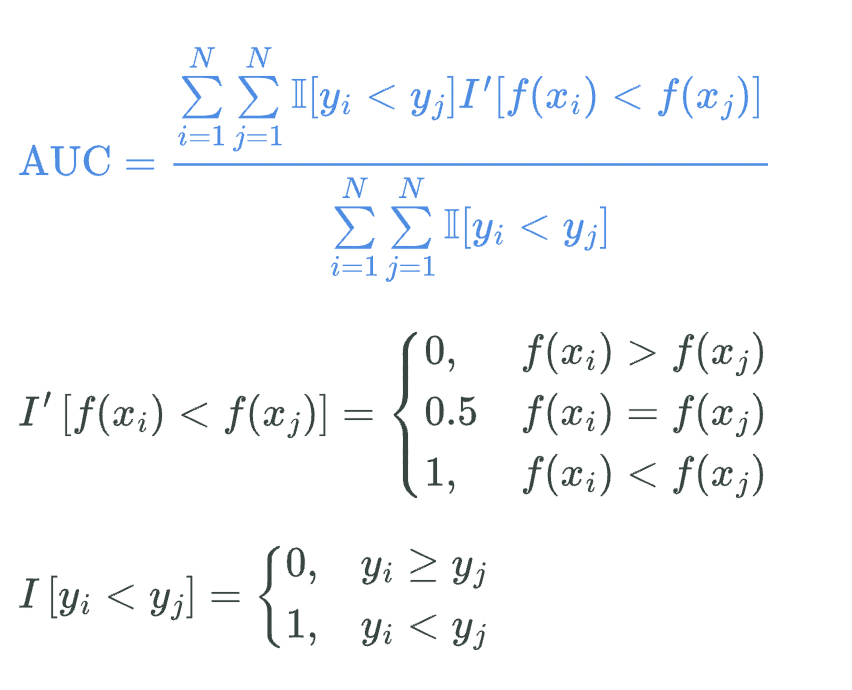

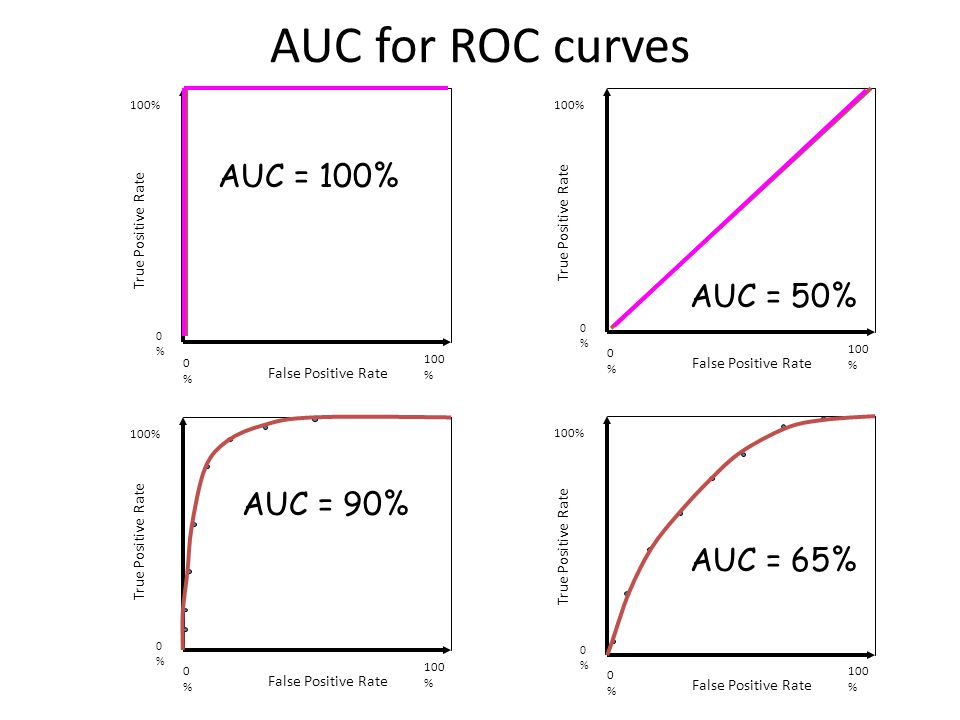

## Average precision

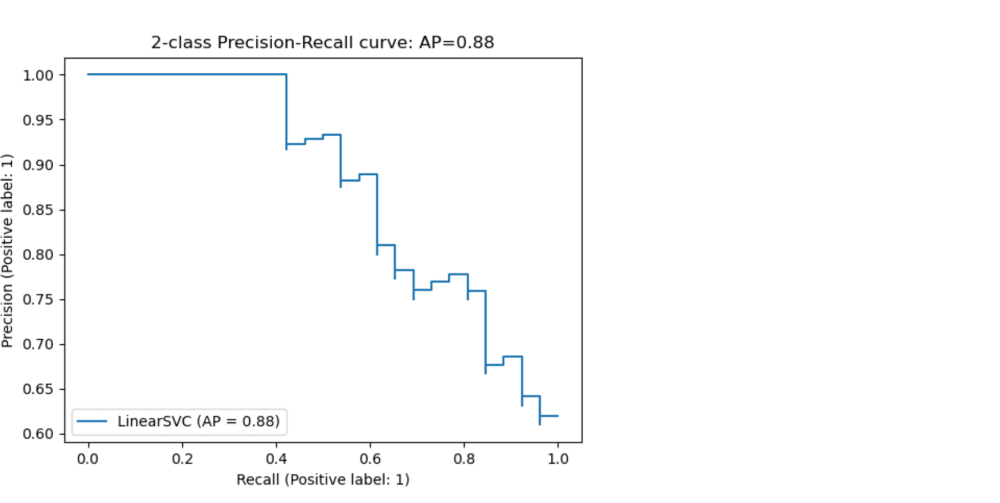

# Кодинг

In [1]:
import torch
import torchvision
from torchmetrics import *
import numpy as np
import os
from PIL import Image

from lightning import Trainer, LightningDataModule, LightningModule

6


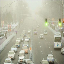

In [2]:
class NpDataset(torch.utils.data.Dataset):
    def __init__(self, images_path: str, targets_path: str = None, transform=None, image_size=(64, 64)):
        self._images = np.memmap(images_path, dtype='uint8', mode='r').reshape(-1, *image_size, 3)
        self._targets = None if targets_path is None else np.memmap(targets_path, dtype='int32', mode='r')
        self._transform = transform

    def __len__(self):
        return len(self._images)

    def __getitem__(self, idx):
        image = Image.fromarray(self._images[idx]).convert('RGB')
        
        if self._transform:
            image = self._transform(image)
        if self._targets is None:
            return image
        target = self._targets[idx]
        return image, target

dataset = NpDataset(images_path='assets/lesson2/test.np', targets_path='assets/lesson2/test_targets.np')
print(dataset[0][1])
dataset[0][0]

In [3]:
class Datamodule(LightningDataModule):
    def __init__(self, data_path):
        super().__init__()
        self._data_path = data_path

    def train_augmentations(self):
        return torchvision.transforms.Compose([
            torchvision.transforms.RandomHorizontalFlip(p=0.5),
            torchvision.transforms.ToTensor(),
            torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])

    def test_augmentations(self):
        return torchvision.transforms.Compose([
            torchvision.transforms.ToTensor(),
            torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])
        
    def setup(self, stage: str):
        if stage == 'fit':
            self._train_dataset = NpDataset(
                images_path=os.path.join(self._data_path, 'train.np'),
                targets_path=os.path.join(self._data_path, 'train_targets.np'),
                transform=self.train_augmentations()
            )

            self._val_dataset = NpDataset(
                images_path=os.path.join(self._data_path, 'val.np'),
                targets_path=os.path.join(self._data_path, 'val_targets.np'),
                transform=self.test_augmentations()
            )

        if stage == 'test':
            self._test_dataset = NpDataset(
                images_path=os.path.join(self._data_path, 'test.np'),
                targets_path=os.path.join(self._data_path, 'test_targets.np'),
                transform=self.test_augmentations()
            )

        if stage == 'predict':
            self._test_dataset = NpDataset(
                images_path=os.path.join(self._data_path, 'test.np'),
                transform=self.test_augmentations()
            )

    def train_dataloader(self):
        return torch.utils.data.DataLoader(dataset=self._train_dataset, batch_size=8, shuffle=True, num_workers=0)

    def val_dataloader(self):
        return torch.utils.data.DataLoader(dataset=self._val_dataset, batch_size=8, shuffle=False, num_workers=0)

    def test_dataloader(self):
        return torch.utils.data.DataLoader(dataset=self._test_dataset, batch_size=8, shuffle=False, num_workers=0)

    def predict_dataloader(self):
        return torch.utils.data.DataLoader(dataset=self._test_dataset, batch_size=8, shuffle=False, num_workers=0)
            
        

In [4]:
from lightning.pytorch.callbacks import BaseFinetuning

class Finetuner(BaseFinetuning):
    def freeze_before_training(self, pl_module):
         # freeze any module you want
         # Here, we are freezing `feature_extractor`
         self.freeze(pl_module._model)
    def finetune_function(self, pl_module, current_epoch, optimizer):
        if current_epoch == 0:
            self.unfreeze_and_add_param_group(
                modules=pl_module._model.fc,
                optimizer=optimizer,
                train_bn=True,
            )

In [5]:
class Learner(LightningModule):
    def __init__(self):
        super().__init__()

        self._model = torchvision.models.resnet18(pretrained=True)
        self._model.fc = torch.nn.Linear(in_features=512, out_features=11, bias=True)
        
        self._loss = torch.nn.CrossEntropyLoss(label_smoothing=0.1)

        self._metric = Accuracy(task='multiclass', num_classes=11)

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, self._model.parameters()), lr=1e-3)
        lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)
        return [optimizer], [lr_scheduler]

    def training_step(self, batch, batch_idx):
        images, targets = batch
        output = self._model(images)
        loss = self._loss(output, targets.long())
        return loss

    def validation_step(self, batch, batch_idx):
        images, targets = batch
        output = self._model(images)
        loss = self._loss(output, targets.long())
    
        self._metric.update(output, targets)
        
        return loss

    def on_validation_epoch_end(self):
        values = self._metric.compute()
        print(f'Accuracy {values} on epoch {self.current_epoch}')
        self._metric.reset()

    def test_step(self, batch, batch_idx):
        self.validation_step(batch, batch_idx)

    def on_test_epoch_end(self):
        self.on_validation_epoch_end()

    def forward(self, inputs):
        return self._model(inputs).argmax(dim=-1)

In [32]:
datamodule = Datamodule(data_path='assets/lesson2/')

learner = Learner()

trainer = Trainer(max_epochs=15, callbacks=[Finetuner()], accelerator='cpu')

/opt/homebrew/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/opt/homebrew/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn

In [33]:
datamodule.setup(stage='fit')
trainer.fit(model=learner, datamodule=datamodule)



  | Name    | Type               | Params
-----------------------------------------------
0 | _model  | ResNet             | 11.2 M
1 | _loss   | CrossEntropyLoss   | 0     
2 | _metric | MulticlassAccuracy | 0     
-----------------------------------------------
9.6 K     Trainable params
11.2 M    Non-trainable params
11.2 M    Total params
44.729    Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Accuracy 0.0625 on epoch 0


/opt/homebrew/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:442: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 10 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
/opt/homebrew/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:442: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 10 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Accuracy 0.6179999709129333 on epoch 0


Validation: 0it [00:00, ?it/s]

Accuracy 0.7139999866485596 on epoch 1


Validation: 0it [00:00, ?it/s]

Accuracy 0.734000027179718 on epoch 2


Validation: 0it [00:00, ?it/s]

Accuracy 0.765999972820282 on epoch 3


Validation: 0it [00:00, ?it/s]

Accuracy 0.7699999809265137 on epoch 4


Validation: 0it [00:00, ?it/s]

Accuracy 0.7639999985694885 on epoch 5


Validation: 0it [00:00, ?it/s]

Accuracy 0.765999972820282 on epoch 6


Validation: 0it [00:00, ?it/s]

Accuracy 0.7739999890327454 on epoch 7


Validation: 0it [00:00, ?it/s]

Accuracy 0.777999997138977 on epoch 8


Validation: 0it [00:00, ?it/s]

Accuracy 0.7699999809265137 on epoch 9


Validation: 0it [00:00, ?it/s]

Accuracy 0.7799999713897705 on epoch 10


Validation: 0it [00:00, ?it/s]

Accuracy 0.7739999890327454 on epoch 11


Validation: 0it [00:00, ?it/s]

Accuracy 0.7739999890327454 on epoch 12


Validation: 0it [00:00, ?it/s]

Accuracy 0.7760000228881836 on epoch 13


Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.


Accuracy 0.7799999713897705 on epoch 14


In [34]:
datamodule.setup(stage='test')
trainer.test(model=learner, datamodule=datamodule)


/opt/homebrew/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:442: PossibleUserWarning: The dataloader, test_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 10 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Testing: 0it [00:00, ?it/s]

Accuracy 0.7696866989135742 on epoch 15


[{}]

In [233]:
datamodule.setup(stage='predict')
results = trainer.predict(model=learner, datamodule=datamodule)
results = torch.cat(results)

/opt/homebrew/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:442: PossibleUserWarning: The dataloader, predict_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 10 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.


Predicting: 0it [00:00, ?it/s]

In [234]:
import pandas as pd

dt = pd.DataFrame()
dt['result'] = results.numpy()

dt.to_csv('submit.csv', index=False)

In [12]:
import pandas as pd

dt = pd.read_csv('/Users/tam2511/Downloads/Homework Voronkov.csv')
dt

,result
0,6
1,4
2,4
3,8
4,1
...,...
2357,9
2358,4
2359,2
2360,7


In [13]:
gts = np.memmap('assets/lesson2/test_targets.np', dtype='int32', mode='r')
gts

memmap([6, 4, 4, ..., 2, 7, 4], dtype=int32)

In [14]:
metric = Accuracy(task='multiclass', num_classes=11)
metric(torch.from_numpy(dt.result.values), torch.from_numpy(gts))

tensor(0.8251)